In [37]:
%matplotlib inline
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plot
import seaborn as sns
from collections import Counter
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from numba import jit
from scipy import spatial
import itertools


iso = ad.read_csv('gastrula_isoform.csv').T
cn = []
for i in iso.obs_names:
    cn.append(i[7:-11].replace('-','.'))
iso.obs_names = cn
meta = pd.read_csv('meta_sleiden.csv')
ori = pd.read_csv('ori_gast_umap.csv')

#iso.obs['cluster_id']=list(meta['clust_id'])
iso.obs = ori


In [41]:
tr_table=pd.read_csv('trtr.txt',sep='\t')
intr = list(set(iso.var_names).intersection(set(tr_table['Transcript stable ID'])))
intr = sorted(intr)
iso = iso[:,intr]
tr_table = tr_table[tr_table['Transcript stable ID'].isin(intr)]
tr_table = tr_table.sort_values(by='Transcript stable ID')
iso.var['Gene name'] = list(tr_table['Gene name'])
iso.var['Transcript name'] = list(tr_table['Transcript name'])
sc.pp.normalize_total(iso)
sc.pp.log1p(iso)

iso_df = iso.to_df()
iso_df.columns = list(iso.var['Gene name'])
iso_df = iso_df.groupby(iso_df.columns, axis=1).sum()
gene = ad.AnnData(iso_df)
ori = pd.read_csv('ori_gast_umap.csv')
gene.obsm['X_umap']=np.array(ori.iloc[:,2:4])
gene.obs = ori


,Transcript stable ID,Gene name,Transcript name,Gene stable ID
193441,ENST00000000233,ARF5,ARF5-201,ENSG00000004059
108899,ENST00000000412,M6PR,M6PR-201,ENSG00000003056
162936,ENST00000000442,ESRRA,ESRRA-201,ENSG00000173153
83564,ENST00000001008,FKBP4,FKBP4-201,ENSG00000004478
137415,ENST00000001146,CYP26B1,CYP26B1-201,ENSG00000003137
...,...,...,...,...
61589,ENST00000650633,LRPAP1,LRPAP1-206,ENSG00000163956
158159,ENST00000650634,CTPS1,CTPS1-218,ENSG00000171793
16589,ENST00000650635,ADA2,ADA2-218,ENSG00000093072
87011,ENST00000650636,HDAC8,HDAC8-260,ENSG00000147099


In [3]:
%matplotlib inline

ori = pd.read_csv('ori_gast_umap.csv')
iso.obsm['X_umap']=np.array(ori.iloc[:,2:4])


In [4]:
def remove_iso(isof):
    gen = tr_table[tr_table['Transcript stable ID']==isof]['Gene name'].values[0]
    ave_iso=np.mean(list(iso[:,isof].X))
    ave_gene = np.mean(list(gene[:,gen].X))
    if ave_iso/ave_gene>0.8:
        return True
    else:
        return False
rem_iso=[]
for i in iso.var_names:
    if(bool(remove_iso(i)))==True:
        rem_iso.append(i)


Keyboard Interrupt


In [5]:
import itertools
rem_iso_all = []
for r in rem_iso:
    gen = tr_table[tr_table['Transcript stable ID']==r]['Gene name'].values[0]
    rem_iso_all.append(list(tr_table[tr_table['Gene name']==gen]['Transcript stable ID']))
rem_iso_all = list(itertools.chain(*rem_iso_all))
    
len(rem_iso_all)


Keyboard Interrupt


In [6]:
#sc.pp.filter_genes(gene, min_cells=5)
def find_trs(gene):
    return list(tr_table[tr_table['Gene name']==gene]['Transcript stable ID'])
def return_gene(mat, g,cl1,cl2):
    g1 = mat[:,g]
    cl_lab = [cl1,cl2]
    g1 = g1[g1.obs['cluster_id'].isin(cl_lab)]
    return g1

def gene_significant(g,cl1,cl2):
    g1 = return_gene(gene,g,cl1,cl2)
    ref = cl1
    tmp=sc.tl.rank_genes_groups(g1, groupby='cluster_id', method= 'wilcoxon', corr_method='benjamini-hochberg'
                     ,copy=True,n_genes=1,reference=ref)
    pvals_adj= tmp.uns['rank_genes_groups']['pvals_adj'][0][0]
    if pvals_adj>0.05:
        return True
    else: 
        return False



In [89]:
def transcript_significant(t_list,p_list):
    new_t = []
    for i in range(0,len(t_list)):
        if(p_list[i]<0.01):
            new_t.append(t_list[i]) 
    return new_t        
    
def find_ng(g,cl1):
    trs = find_trs(g)
    #iso_rem = iso[:,rem_iso_all]
    tr_list =[]
    for i in set(gene.obs['cluster_id']):
        if i!=cl1 and bool(gene_significant(g,cl1,i))==True:
            #iso_f=iso.copy()
            
            g1 = return_gene(iso,trs,cl1,i).copy()
            #sc.pp.filter_genes(g1,min_cells=5,inplace=True)
            if len(g1[0,:])>0:
                tmp = sc.tl.rank_genes_groups(g1,groupby='cluster_id', method= 'wilcoxon', corr_method='benjamini-hochberg' ,copy=True,reference=i,
                                             groups = [cl1,i])

                tmp_list2 = list(tmp.uns['rank_genes_groups']['names'])
                tmp_list2 = [x[0] for x in tmp_list2]
                padj_list2 = list(tmp.uns['rank_genes_groups']['pvals_adj'])
                padj_list2 = [x[0] for x in padj_list2]
                tmp_list2=transcript_significant(tmp_list2,padj_list2)
                tmp_list3 = list(set(tmp_list2).difference(set(rem_iso_all)))
                tmp_list3.insert(0,i)
                if(len(tmp_list3)>1):
                    tr_list.append(tmp_list3)
            
    return tr_list

#tb= find_ng('TBXT','Primitive Streak')
#tb

In [90]:
from tqdm import tqdm
gene_f = gene.copy()
sc.pp.filter_genes(gene_f,min_cells=30,inplace=True)
ps_list2=[]
for i in tqdm(gene_f.var_names):
    ps = find_ng(i,'Nascent Mesodeerm')
    #ps.append(i)
    if(len(ps)>0):
        ps_list2.append(ps)


  0%|          | 0/16664 [00:00<?, ?it/s]... storing 'cluster_id' as categorical


---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
script_9001850299546582828 in gene_significant
          ref = cl1
          tmp=sc.tl.rank_genes_groups(g1, groupby='cluster_id', method= 'wilcoxon', corr_method='benjamini-hochberg'
---->                      ,copy=True,n_genes=1,reference=ref)
          pvals_adj= tmp.uns['rank_genes_groups']['pvals_adj'][0][0]
          if pvals_adj>0.05:
              return True
script_6964492762146499188 in find_ng
          tr_list =[]
          for i in set(gene.obs['cluster_id']):
---->         if i!=cl1 and bool(gene_significant(g,cl1,i))==True:
                  #iso_f=iso.copy()
      
                  g1 = return_gene(iso,trs,cl1,i).copy()
script_8042258230472598094 in <module>
      ps_list2=[]
      for i in tqdm(gene_f.var_names):
---->     ps = find_ng(

In [845]:
'''ps_gene = []
#ps_df = pd.DataFrame(ps_list3)
for i in ps_df[1]:
    x = list(tr_table[tr_table['Transcript stable ID']==i]['Gene name'])[0]
    ps_gene.append(x)
ps_df['Gene name'] = ps_gene
'''
#ps_df = ps_df.sort_values(by=0)
#ps_df.to_excel("ps_iso.xlsx", sheet_name='Sheet_name_1')


In [815]:
nm_list=[]
for i in tqdm(gene_f.var_names):
    ps = find_ng(i,'Nascent Mesoderm')
    #ps.append(i)
    if(len(ps)>0):
        nm_list.append(ps)














  0%|          | 0/16664 [00:00<?, ?it/s]/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  0%|       

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  0%|          | 32/16664 [00:16<1:56:36,  2.38it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  0%|          | 33/16664 [00:16<1:57:09,  2.37it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  0%|          | 65/16664 [00:29<1:51:36,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  0%|          | 66/16664 [00:29<1:51:43,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

  1%|          | 97/16664 [00:42<1:58:10,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|          | 98/16664 [00:42<1:58:01,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|          | 99/16664 [00:43<2:00:05,  2.30it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|          | 130/16664 [00:55<2:00:00,  2.30it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|          | 131/16664 [00:56<2:01:14,  2.27it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|          | 163/16664 [01:10<2:06:50,  2.17it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|          | 164/16664 [01:10<2:08:52,  2.13it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  1%|1         | 195/16664 [01:24<1:58:28,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|1         | 196/16664 [01:24<1:57:38,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|1         | 197/16664 [01:25<2:05:12,  2.19it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|1         | 228/16664 [01:38<1:56:27,  2.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  1%|1         | 229/16664 [01:38<1:56:21,  2.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|1         | 261/16664 [01:54<1:54:30,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|1         | 262/16664 [01:54<1:57:50,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  2%|1         | 293/16664 [02:07<2:13:44,  2.04it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|1         | 294/16664 [02:08<2:19:31,  1.96it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|1         | 295/16664 [02:08<2:22:12,  1.92it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|1         | 326/16664 [02:22<1:59:10,  2.28it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|1         | 327/16664 [02:22<1:56:39,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|2         | 359/16664 [02:38<1:57:34,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|2         | 360/16664 [02:39<1:58:10,  2.30it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  2%|2         | 391/16664 [02:52<1:51:06,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|2         | 392/16664 [02:52<1:51:56,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  2%|2         | 393/16664 [02:53<1:52:29,  2.41it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|2         | 424/16664 [03:06<1:58:41,  2.28it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|2         | 425/16664 [03:06<1:50:14,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|2         | 457/16664 [03:20<1:55:40,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|2         | 458/16664 [03:21<1:58:39,  2.28it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  3%|2         | 489/16664 [03:35<2:29:22,  1.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|2         | 490/16664 [03:35<2:19:24,  1.93it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|2         | 491/16664 [03:36<2:18:16,  1.95it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|3         | 522/16664 [03:52<2:20:52,  1.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|3         | 523/16664 [03:53<2:45:29,  1.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|3         | 555/16664 [04:16<3:07:31,  1.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  3%|3         | 556/16664 [04:17<2:44:39,  1.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  4%|3         | 587/16664 [04:33<1:54:57,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|3         | 588/16664 [04:34<2:03:23,  2.17it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|3         | 589/16664 [04:34<2:16:50,  1.96it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|3         | 620/16664 [04:49<2:01:42,  2.20it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|3         | 621/16664 [04:49<1:59:32,  2.24it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|3         | 653/16664 [05:04<2:08:51,  2.07it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|3         | 654/16664 [05:05<2:27:23,  1.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  4%|4         | 685/16664 [05:20<1:55:30,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|4         | 686/16664 [05:20<2:00:35,  2.21it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|4         | 687/16664 [05:21<2:08:21,  2.07it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|4         | 718/16664 [05:38<3:20:04,  1.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  4%|4         | 719/16664 [05:39<3:10:36,  1.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|4         | 751/16664 [05:52<1:53:08,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|4         | 752/16664 [05:53<1:53:36,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  5%|4         | 783/16664 [06:06<1:52:04,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|4         | 784/16664 [06:06<1:51:41,  2.37it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|4         | 785/16664 [06:06<1:49:32,  2.42it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|4         | 816/16664 [06:20<1:50:34,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|4         | 817/16664 [06:21<1:51:26,  2.37it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|5         | 849/16664 [06:34<1:51:50,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|5         | 850/16664 [06:34<1:52:19,  2.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  5%|5         | 881/16664 [06:48<1:52:29,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|5         | 882/16664 [06:48<1:51:53,  2.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|5         | 883/16664 [06:48<1:45:58,  2.48it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|5         | 914/16664 [07:01<1:43:50,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  5%|5         | 915/16664 [07:02<1:54:45,  2.29it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|5         | 947/16664 [07:15<1:42:10,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|5         | 948/16664 [07:15<1:45:32,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

  6%|5         | 979/16664 [07:28<1:44:22,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|5         | 980/16664 [07:29<1:47:32,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|5         | 981/16664 [07:29<1:48:22,  2.41it/s]... storing 'clus

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|6         | 1012/16664 [07:42<1:39:30,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|6         | 1013/16664 [07:42<1:41:37,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  6%|6         | 1028/16664 [07:49<1:41:11,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|6         | 1029/16664 [07:49<1:45:06,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|6         | 1030/16664 [07:49<1:47:24,  2.43it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|6         | 1061/16664 [08:02<1:53:23,  2.29it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  6%|6         | 1062/16664 [08:03<1:51:54,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  7%|6         | 1093/16664 [08:17<1:56:45,  2.22it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|6         | 1094/16664 [08:17<1:54:27,  2.27it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|6         | 1095/16664 [08:18<1:49:28,  2.37it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|6         | 1126/16664 [08:31<1:47:30,  2.41it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|6         | 1127/16664 [08:31<1:48:14,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  7%|6         | 1158/16664 [08:44<1:51:30,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|6         | 1159/16664 [08:45<1:50:59,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|6         | 1160/16664 [08:45<1:51:25,  2.32it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|7         | 1191/16664 [08:58<1:47:01,  2.41it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|7         | 1192/16664 [08:58<1:47:41,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  7%|7         | 1223/16664 [09:12<1:44:56,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|7         | 1224/16664 [09:12<1:45:47,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  7%|7         | 1225/16664 [09:12<1:46:15,  2.42it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|7         | 1256/16664 [09:25<1:31:57,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|7         | 1257/16664 [09:25<1:36:01,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  8%|7         | 1288/16664 [09:37<1:33:25,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|7         | 1289/16664 [09:37<1:27:58,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|7         | 1290/16664 [09:38<1:25:52,  2.98it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|7         | 1321/16664 [09:50<1:29:35,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|7         | 1322/16664 [09:50<1:24:26,  3.03it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  8%|8         | 1353/16664 [10:02<1:37:30,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|8         | 1354/16664 [10:03<1:41:12,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|8         | 1355/16664 [10:03<1:36:48,  2.64it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|8         | 1386/16664 [10:17<1:52:08,  2.27it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  8%|8         | 1387/16664 [10:17<1:49:42,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  9%|8         | 1418/16664 [10:30<1:37:52,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|8         | 1419/16664 [10:31<1:36:00,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|8         | 1420/16664 [10:31<1:39:35,  2.55it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|8         | 1451/16664 [10:43<1:45:57,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|8         | 1452/16664 [10:44<1:45:44,  2.40it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  9%|8         | 1483/16664 [10:56<1:48:43,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|8         | 1484/16664 [10:57<1:45:58,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|8         | 1485/16664 [10:57<1:41:24,  2.49it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|9         | 1516/16664 [11:09<1:43:39,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|9         | 1517/16664 [11:09<1:43:09,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

  9%|9         | 1548/16664 [11:21<1:37:06,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|9         | 1549/16664 [11:22<1:38:17,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|9         | 1550/16664 [11:22<1:40:35,  2.50it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|9         | 1581/16664 [11:35<1:44:18,  2.41it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












  9%|9         | 1582/16664 [11:35<1:34:47,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 10%|9         | 1613/16664 [11:48<1:46:10,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|9         | 1614/16664 [11:48<1:47:44,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|9         | 1615/16664 [11:49<1:47:02,  2.34it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|9         | 1646/16664 [12:02<1:46:36,  2.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|9         | 1647/16664 [12:02<1:48:17,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 10%|#         | 1678/16664 [12:16<1:46:36,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|#         | 1679/16664 [12:16<1:46:02,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|#         | 1680/16664 [12:17<1:45:26,  2.37it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|#         | 1711/16664 [12:30<1:46:21,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|#         | 1712/16664 [12:30<1:44:48,  2.38it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 10%|#         | 1743/16664 [12:44<1:47:12,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|#         | 1744/16664 [12:44<1:47:51,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 10%|#         | 1745/16664 [12:44<1:46:51,  2.33it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#         | 1776/16664 [12:57<1:42:03,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#         | 1777/16664 [12:58<1:42:37,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 11%|#         | 1808/16664 [13:11<1:46:02,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#         | 1809/16664 [13:11<1:47:30,  2.30it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#         | 1810/16664 [13:12<1:53:34,  2.18it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#1        | 1841/16664 [13:25<1:46:24,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#1        | 1842/16664 [13:26<1:46:04,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 11%|#1        | 1873/16664 [13:38<1:34:57,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#1        | 1874/16664 [13:39<1:37:36,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#1        | 1875/16664 [13:39<1:36:53,  2.54it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#1        | 1906/16664 [13:52<1:43:12,  2.38it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 11%|#1        | 1907/16664 [13:53<1:44:02,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 12%|#1        | 1938/16664 [14:05<1:36:38,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#1        | 1939/16664 [14:06<1:38:32,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#1        | 1940/16664 [14:06<1:40:27,  2.44it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#1        | 1971/16664 [14:20<1:43:05,  2.38it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#1        | 1972/16664 [14:20<1:42:58,  2.38it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 12%|#2        | 2003/16664 [14:32<1:40:19,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#2        | 2004/16664 [14:33<1:36:14,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#2        | 2005/16664 [14:33<1:38:21,  2.48it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#2        | 2036/16664 [14:46<1:32:53,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#2        | 2037/16664 [14:46<1:36:43,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 12%|#2        | 2068/16664 [14:58<1:31:17,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#2        | 2069/16664 [14:59<1:32:56,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 12%|#2        | 2070/16664 [14:59<1:35:44,  2.54it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#2        | 2101/16664 [15:11<1:41:36,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#2        | 2102/16664 [15:12<1:43:39,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 13%|#2        | 2133/16664 [15:24<1:44:27,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#2        | 2134/16664 [15:25<1:44:14,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#2        | 2135/16664 [15:25<1:44:55,  2.31it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#2        | 2166/16664 [15:37<1:30:40,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#3        | 2167/16664 [15:37<1:35:54,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 13%|#3        | 2198/16664 [15:53<1:45:09,  2.29it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#3        | 2199/16664 [15:54<1:43:54,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#3        | 2200/16664 [15:54<1:47:22,  2.25it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#3        | 2231/16664 [16:08<2:03:05,  1.95it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 13%|#3        | 2232/16664 [16:08<2:10:09,  1.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 14%|#3        | 2263/16664 [16:23<2:03:24,  1.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#3        | 2264/16664 [16:23<2:01:55,  1.97it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#3        | 2265/16664 [16:24<2:00:53,  1.99it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#3        | 2296/16664 [16:36<1:43:55,  2.30it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#3        | 2297/16664 [16:36<1:41:52,  2.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 14%|#3        | 2328/16664 [16:48<1:29:08,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#3        | 2329/16664 [16:48<1:32:04,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#3        | 2330/16664 [16:49<1:34:09,  2.54it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#4        | 2361/16664 [17:01<1:27:08,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#4        | 2362/16664 [17:01<1:31:12,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 14%|#4        | 2393/16664 [17:13<1:41:42,  2.34it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#4        | 2394/16664 [17:14<1:35:21,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 14%|#4        | 2395/16664 [17:14<1:27:44,  2.71it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#4        | 2426/16664 [17:27<1:42:55,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#4        | 2427/16664 [17:27<1:42:38,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 15%|#4        | 2458/16664 [17:40<1:30:13,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#4        | 2459/16664 [17:40<1:25:36,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#4        | 2460/16664 [17:40<1:17:11,  3.07it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#4        | 2491/16664 [17:52<1:41:29,  2.33it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#4        | 2492/16664 [17:53<1:37:45,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 15%|#5        | 2523/16664 [18:05<1:34:26,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#5        | 2524/16664 [18:05<1:34:33,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#5        | 2525/16664 [18:06<1:29:32,  2.63it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#5        | 2556/16664 [18:19<1:25:30,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 15%|#5        | 2557/16664 [18:19<1:25:20,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 16%|#5        | 2588/16664 [18:31<1:42:14,  2.29it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#5        | 2589/16664 [18:32<1:38:22,  2.38it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#5        | 2590/16664 [18:32<1:39:03,  2.37it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#5        | 2621/16664 [18:44<1:28:10,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#5        | 2622/16664 [18:45<1:27:06,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 16%|#5        | 2653/16664 [18:56<1:15:50,  3.08it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#5        | 2654/16664 [18:57<1:16:06,  3.07it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#5        | 2655/16664 [18:57<1:23:13,  2.81it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#6        | 2686/16664 [19:08<1:36:20,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#6        | 2687/16664 [19:09<1:37:05,  2.40it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 16%|#6        | 2718/16664 [19:21<1:14:43,  3.11it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#6        | 2719/16664 [19:21<1:21:55,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 16%|#6        | 2720/16664 [19:22<1:25:05,  2.73it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#6        | 2751/16664 [19:34<1:38:01,  2.37it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#6        | 2752/16664 [19:35<1:36:24,  2.41it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 17%|#6        | 2783/16664 [19:47<1:31:59,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#6        | 2784/16664 [19:47<1:22:01,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#6        | 2785/16664 [19:48<1:18:35,  2.94it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#6        | 2816/16664 [19:59<1:28:03,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#6        | 2817/16664 [20:00<1:20:05,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 17%|#7        | 2848/16664 [20:12<1:39:48,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#7        | 2849/16664 [20:13<1:36:18,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#7        | 2850/16664 [20:13<1:37:48,  2.35it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#7        | 2881/16664 [20:25<1:33:21,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#7        | 2882/16664 [20:26<1:32:58,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 17%|#7        | 2913/16664 [20:38<1:30:16,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#7        | 2914/16664 [20:38<1:32:58,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 17%|#7        | 2915/16664 [20:39<1:32:48,  2.47it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#7        | 2946/16664 [20:51<1:31:04,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#7        | 2947/16664 [20:51<1:32:43,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 18%|#7        | 2978/16664 [21:03<1:23:17,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#7        | 2979/16664 [21:04<1:28:59,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#7        | 2980/16664 [21:04<1:31:16,  2.50it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#8        | 3011/16664 [21:16<1:28:29,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#8        | 3012/16664 [21:17<1:23:34,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 18%|#8        | 3043/16664 [21:29<1:30:46,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#8        | 3044/16664 [21:29<1:32:22,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#8        | 3045/16664 [21:30<1:35:09,  2.39it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#8        | 3076/16664 [21:42<1:29:02,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 18%|#8        | 3077/16664 [21:43<1:29:36,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 19%|#8        | 3108/16664 [21:55<1:33:09,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#8        | 3109/16664 [21:55<1:32:29,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#8        | 3110/16664 [21:56<1:33:25,  2.42it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#8        | 3141/16664 [22:09<1:47:09,  2.10it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#8        | 3142/16664 [22:09<1:44:04,  2.17it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 19%|#9        | 3173/16664 [22:22<1:28:47,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#9        | 3174/16664 [22:22<1:27:02,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#9        | 3175/16664 [22:22<1:20:31,  2.79it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#9        | 3206/16664 [22:35<1:34:28,  2.37it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#9        | 3207/16664 [22:36<1:34:55,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 19%|#9        | 3238/16664 [22:48<1:32:58,  2.41it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#9        | 3239/16664 [22:49<1:33:22,  2.40it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 19%|#9        | 3240/16664 [22:49<1:23:02,  2.69it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|#9        | 3271/16664 [23:01<1:22:45,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|#9        | 3272/16664 [23:01<1:26:29,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 20%|#9        | 3303/16664 [23:14<1:38:29,  2.26it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|#9        | 3304/16664 [23:15<1:37:27,  2.28it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|#9        | 3305/16664 [23:15<1:35:05,  2.34it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|##        | 3336/16664 [23:27<1:24:37,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|##        | 3337/16664 [23:27<1:35:55,  2.32it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 20%|##        | 3368/16664 [23:39<1:21:57,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|##        | 3369/16664 [23:40<1:25:58,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|##        | 3370/16664 [23:40<1:28:38,  2.50it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|##        | 3401/16664 [23:53<1:26:19,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 20%|##        | 3402/16664 [23:53<1:29:33,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 21%|##        | 3433/16664 [24:05<1:23:35,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##        | 3434/16664 [24:06<1:24:31,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##        | 3435/16664 [24:06<1:20:42,  2.73it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##        | 3466/16664 [24:19<1:29:29,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##        | 3467/16664 [24:19<1:30:13,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 21%|##        | 3498/16664 [24:32<1:24:50,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##        | 3499/16664 [24:32<1:19:47,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##1       | 3500/16664 [24:32<1:24:44,  2.59it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##1       | 3531/16664 [24:45<1:25:07,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##1       | 3532/16664 [24:45<1:18:31,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 21%|##1       | 3563/16664 [24:56<1:14:54,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##1       | 3564/16664 [24:57<1:20:16,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 21%|##1       | 3565/16664 [24:57<1:23:20,  2.62it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##1       | 3596/16664 [25:09<1:25:00,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##1       | 3597/16664 [25:09<1:25:52,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 22%|##1       | 3628/16664 [25:21<1:18:31,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##1       | 3629/16664 [25:21<1:16:05,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##1       | 3630/16664 [25:21<1:19:19,  2.74it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##1       | 3661/16664 [25:33<1:22:34,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##1       | 3662/16664 [25:34<1:13:36,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 22%|##2       | 3693/16664 [25:45<1:15:29,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##2       | 3694/16664 [25:46<1:10:22,  3.07it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##2       | 3695/16664 [25:46<1:13:13,  2.95it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##2       | 3726/16664 [25:57<1:13:51,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 22%|##2       | 3727/16664 [25:57<1:16:32,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 23%|##2       | 3758/16664 [26:09<1:21:23,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##2       | 3759/16664 [26:09<1:21:27,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##2       | 3760/16664 [26:09<1:23:09,  2.59it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##2       | 3791/16664 [26:21<1:04:06,  3.35it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##2       | 3792/16664 [26:21<1:11:07,  3.02it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 23%|##2       | 3823/16664 [26:32<1:02:32,  3.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##2       | 3824/16664 [26:33<1:00:01,  3.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##2       | 3825/16664 [26:33<1:08:33,  3.12it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##3       | 3856/16664 [26:44<1:22:44,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##3       | 3857/16664 [26:44<1:20:02,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 23%|##3       | 3888/16664 [26:56<1:19:09,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##3       | 3889/16664 [26:56<1:18:53,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 23%|##3       | 3890/16664 [26:56<1:15:31,  2.82it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##3       | 3921/16664 [27:08<1:23:02,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##3       | 3922/16664 [27:08<1:23:01,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 24%|##3       | 3953/16664 [27:19<1:16:19,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##3       | 3954/16664 [27:20<1:19:03,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##3       | 3955/16664 [27:20<1:14:34,  2.84it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##3       | 3986/16664 [27:31<1:17:18,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##3       | 3987/16664 [27:32<1:15:54,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 24%|##4       | 4018/16664 [27:44<1:25:37,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##4       | 4019/16664 [27:44<1:28:16,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##4       | 4020/16664 [27:44<1:24:49,  2.48it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##4       | 4051/16664 [27:55<1:12:23,  2.90it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 24%|##4       | 4052/16664 [27:56<1:15:56,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 25%|##4       | 4083/16664 [28:07<1:18:25,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##4       | 4084/16664 [28:07<1:21:02,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##4       | 4085/16664 [28:08<1:19:10,  2.65it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##4       | 4116/16664 [28:19<1:14:04,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##4       | 4117/16664 [28:20<1:17:07,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 25%|##4       | 4148/16664 [28:31<1:11:24,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##4       | 4149/16664 [28:31<1:11:23,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##4       | 4150/16664 [28:31<1:15:29,  2.76it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##5       | 4181/16664 [28:43<1:13:21,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##5       | 4182/16664 [28:43<1:16:48,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 25%|##5       | 4213/16664 [28:54<1:13:53,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##5       | 4214/16664 [28:55<1:12:34,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##5       | 4215/16664 [28:55<1:09:09,  3.00it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##5       | 4246/16664 [29:06<1:26:35,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 25%|##5       | 4247/16664 [29:07<1:25:20,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 26%|##5       | 4278/16664 [29:18<1:09:18,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##5       | 4279/16664 [29:19<1:13:55,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##5       | 4280/16664 [29:19<1:14:47,  2.76it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##5       | 4311/16664 [29:30<1:22:48,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##5       | 4312/16664 [29:30<1:17:47,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 26%|##6       | 4343/16664 [29:41<1:13:17,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##6       | 4344/16664 [29:41<1:16:21,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##6       | 4345/16664 [29:42<1:18:31,  2.61it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##6       | 4376/16664 [29:53<1:12:05,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##6       | 4377/16664 [29:54<1:15:55,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 26%|##6       | 4408/16664 [30:05<1:19:13,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##6       | 4409/16664 [30:06<1:20:39,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 26%|##6       | 4410/16664 [30:06<1:13:51,  2.77it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##6       | 4441/16664 [30:18<1:18:16,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##6       | 4442/16664 [30:18<1:19:39,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 27%|##6       | 4473/16664 [30:30<1:10:56,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##6       | 4474/16664 [30:30<1:14:44,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##6       | 4475/16664 [30:31<1:16:40,  2.65it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##7       | 4506/16664 [30:42<1:11:15,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##7       | 4507/16664 [30:42<1:15:02,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 27%|##7       | 4538/16664 [30:53<1:15:54,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##7       | 4539/16664 [30:54<1:15:49,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##7       | 4540/16664 [30:54<1:17:41,  2.60it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##7       | 4571/16664 [31:06<1:10:16,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 27%|##7       | 4572/16664 [31:06<1:13:38,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 28%|##7       | 4603/16664 [31:17<1:04:39,  3.11it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##7       | 4604/16664 [31:18<1:07:50,  2.96it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##7       | 4605/16664 [31:18<1:13:19,  2.74it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##7       | 4636/16664 [31:30<1:20:15,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##7       | 4637/16664 [31:30<1:14:17,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 28%|##8       | 4668/16664 [31:42<1:20:10,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##8       | 4669/16664 [31:42<1:19:18,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##8       | 4670/16664 [31:43<1:19:58,  2.50it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##8       | 4701/16664 [31:54<1:08:14,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##8       | 4702/16664 [31:54<1:06:55,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 28%|##8       | 4733/16664 [32:06<1:11:50,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##8       | 4734/16664 [32:06<1:14:50,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 28%|##8       | 4735/16664 [32:06<1:11:04,  2.80it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##8       | 4766/16664 [32:18<1:03:46,  3.11it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##8       | 4767/16664 [32:18<1:01:32,  3.22it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 29%|##8       | 4798/16664 [32:29<1:16:47,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##8       | 4799/16664 [32:29<1:15:39,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##8       | 4800/16664 [32:30<1:09:41,  2.84it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##8       | 4831/16664 [32:41<1:07:26,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##8       | 4832/16664 [32:41<1:12:57,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 29%|##9       | 4863/16664 [32:53<1:07:29,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##9       | 4864/16664 [32:53<1:06:40,  2.95it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##9       | 4865/16664 [32:54<1:09:05,  2.85it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##9       | 4896/16664 [33:05<1:10:18,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 29%|##9       | 4897/16664 [33:06<1:08:00,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 30%|##9       | 4928/16664 [33:17<1:13:51,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|##9       | 4929/16664 [33:18<1:15:17,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|##9       | 4930/16664 [33:18<1:16:28,  2.56it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|##9       | 4961/16664 [33:29<1:11:18,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|##9       | 4962/16664 [33:30<1:14:07,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 30%|##9       | 4993/16664 [33:41<1:18:11,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|##9       | 4994/16664 [33:42<1:14:45,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|##9       | 4995/16664 [33:42<1:14:53,  2.60it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|###       | 5026/16664 [33:54<1:07:29,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|###       | 5027/16664 [33:54<1:06:27,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 30%|###       | 5058/16664 [34:05<1:16:04,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|###       | 5059/16664 [34:06<1:16:41,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 30%|###       | 5060/16664 [34:06<1:18:02,  2.48it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###       | 5091/16664 [34:18<1:11:08,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###       | 5092/16664 [34:18<1:10:58,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 31%|###       | 5123/16664 [34:30<1:13:06,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###       | 5124/16664 [34:30<1:15:43,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###       | 5125/16664 [34:31<1:17:45,  2.47it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###       | 5156/16664 [34:42<1:14:35,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###       | 5157/16664 [34:42<1:15:49,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 31%|###1      | 5188/16664 [34:54<1:14:08,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###1      | 5189/16664 [34:54<1:09:18,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###1      | 5190/16664 [34:55<1:06:01,  2.90it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###1      | 5221/16664 [35:06<1:14:39,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 31%|###1      | 5222/16664 [35:06<1:13:39,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 32%|###1      | 5253/16664 [35:18<1:12:32,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###1      | 5254/16664 [35:18<1:13:49,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###1      | 5255/16664 [35:18<1:11:02,  2.68it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###1      | 5286/16664 [35:30<1:15:09,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###1      | 5287/16664 [35:30<1:15:08,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 32%|###1      | 5318/16664 [35:42<1:06:13,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###1      | 5319/16664 [35:42<1:08:34,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###1      | 5320/16664 [35:43<1:07:56,  2.78it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###2      | 5351/16664 [35:54<1:08:52,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###2      | 5352/16664 [35:55<1:11:15,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 32%|###2      | 5383/16664 [36:06<1:05:34,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###2      | 5384/16664 [36:06<1:08:57,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 32%|###2      | 5385/16664 [36:06<1:00:27,  3.11it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###2      | 5416/16664 [36:18<1:13:38,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###2      | 5417/16664 [36:18<1:14:52,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 33%|###2      | 5448/16664 [36:30<1:07:25,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###2      | 5449/16664 [36:30<1:07:42,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###2      | 5450/16664 [36:30<1:08:56,  2.71it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###2      | 5481/16664 [36:42<1:07:30,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###2      | 5482/16664 [36:42<1:10:12,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 33%|###3      | 5513/16664 [36:54<1:13:49,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###3      | 5514/16664 [36:54<1:07:19,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###3      | 5515/16664 [36:54<1:07:30,  2.75it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###3      | 5546/16664 [37:06<1:12:35,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###3      | 5547/16664 [37:07<1:13:19,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 33%|###3      | 5578/16664 [37:18<1:07:05,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###3      | 5579/16664 [37:18<1:03:52,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 33%|###3      | 5580/16664 [37:19<1:04:01,  2.89it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###3      | 5611/16664 [37:30<1:11:52,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###3      | 5612/16664 [37:30<1:11:41,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 34%|###3      | 5643/16664 [37:41<1:02:45,  2.93it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###3      | 5644/16664 [37:41<1:04:06,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###3      | 5645/16664 [37:42<1:08:04,  2.70it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###4      | 5676/16664 [37:53<1:03:10,  2.90it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###4      | 5677/16664 [37:54<1:04:05,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 34%|###4      | 5708/16664 [38:05<1:10:37,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###4      | 5709/16664 [38:05<1:11:49,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###4      | 5710/16664 [38:06<1:11:36,  2.55it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###4      | 5741/16664 [38:17<1:10:07,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 34%|###4      | 5742/16664 [38:18<1:12:02,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 35%|###4      | 5773/16664 [38:29<1:13:32,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###4      | 5774/16664 [38:30<1:13:39,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###4      | 5775/16664 [38:30<1:13:44,  2.46it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###4      | 5806/16664 [38:42<1:12:13,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###4      | 5807/16664 [38:43<1:11:26,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 35%|###5      | 5838/16664 [38:55<1:10:23,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###5      | 5839/16664 [38:55<1:07:59,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###5      | 5840/16664 [38:55<1:09:04,  2.61it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###5      | 5871/16664 [39:08<1:13:05,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###5      | 5872/16664 [39:08<1:13:01,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 35%|###5      | 5903/16664 [39:19<1:07:27,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###5      | 5904/16664 [39:19<1:06:11,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 35%|###5      | 5905/16664 [39:20<1:04:46,  2.77it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###5      | 5936/16664 [39:31<1:10:35,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###5      | 5937/16664 [39:32<1:12:11,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 36%|###5      | 5968/16664 [39:44<1:03:10,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###5      | 5969/16664 [39:44<1:02:49,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###5      | 5970/16664 [39:44<1:03:22,  2.81it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###6      | 6001/16664 [39:56<1:09:25,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###6      | 6002/16664 [39:57<1:10:41,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 36%|###6      | 6033/16664 [40:08<1:06:28,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###6      | 6034/16664 [40:08<1:00:33,  2.93it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###6      | 6035/16664 [40:09<1:03:03,  2.81it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###6      | 6066/16664 [40:21<1:09:38,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 36%|###6      | 6067/16664 [40:21<1:10:42,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 37%|###6      | 6098/16664 [40:32<1:08:27,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###6      | 6099/16664 [40:33<1:09:03,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###6      | 6100/16664 [40:33<1:09:55,  2.52it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###6      | 6131/16664 [40:45<1:01:43,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###6      | 6132/16664 [40:45<1:02:15,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 37%|###6      | 6163/16664 [40:57<1:00:59,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###6      | 6164/16664 [40:57<1:04:03,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###6      | 6165/16664 [40:58<1:05:51,  2.66it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###7      | 6196/16664 [41:09<56:57,  3.06it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###7      | 6197/16664 [41:10<1:01:30,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 37%|###7      | 6228/16664 [41:21<59:46,  2.91it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###7      | 6229/16664 [41:21<1:03:27,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 37%|###7      | 6230/16664 [41:22<1:05:03,  2.67it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###7      | 6261/16664 [41:33<1:02:28,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###7      | 6262/16664 [41:33<1:04:21,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 38%|###7      | 6293/16664 [41:44<57:26,  3.01it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###7      | 6294/16664 [41:44<1:01:55,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###7      | 6295/16664 [41:45<1:05:02,  2.66it/s]... storing 'clu

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###7      | 6326/16664 [41:57<1:02:09,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###7      | 6327/16664 [41:57<1:04:15,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 38%|###8      | 6358/16664 [42:09<1:03:12,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###8      | 6359/16664 [42:10<1:06:50,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###8      | 6360/16664 [42:10<1:07:26,  2.55it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###8      | 6391/16664 [42:22<1:03:07,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 38%|###8      | 6392/16664 [42:22<1:05:12,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 39%|###8      | 6423/16664 [42:34<1:03:49,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###8      | 6424/16664 [42:34<1:03:14,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###8      | 6425/16664 [42:34<1:03:04,  2.71it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###8      | 6456/16664 [42:46<1:00:30,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###8      | 6457/16664 [42:47<1:00:12,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 39%|###8      | 6488/16664 [42:58<1:06:10,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###8      | 6489/16664 [42:58<56:03,  3.03it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###8      | 6490/16664 [42:59<1:00:12,  2.82it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###9      | 6521/16664 [43:10<1:02:44,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###9      | 6522/16664 [43:10<57:52,  2.92it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 39%|###9      | 6537/16664 [43:16<57:48,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###9      | 6538/16664 [43:16<1:00:53,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###9      | 6539/16664 [43:16<1:01:58,  2.72it/s]... storing 'clu

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###9      | 6570/16664 [43:28<1:04:41,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 39%|###9      | 6571/16664 [43:28<1:06:38,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 40%|###9      | 6602/16664 [43:40<1:05:20,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|###9      | 6603/16664 [43:40<1:06:28,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|###9      | 6604/16664 [43:40<1:06:09,  2.53it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|###9      | 6635/16664 [43:52<1:04:01,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|###9      | 6636/16664 [43:52<1:00:50,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 40%|####      | 6667/16664 [44:04<1:01:47,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|####      | 6668/16664 [44:05<1:02:36,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|####      | 6669/16664 [44:05<58:50,  2.83it/s]  ... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|####      | 6700/16664 [44:17<59:03,  2.81it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|####      | 6701/16664 [44:17<1:02:11,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 40%|####      | 6732/16664 [44:29<1:02:44,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|####      | 6733/16664 [44:29<1:04:07,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 40%|####      | 6734/16664 [44:29<1:04:08,  2.58it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####      | 6765/16664 [44:40<57:13,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####      | 6766/16664 [44:41<1:01:38,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

 41%|####      | 6797/16664 [44:53<57:11,  2.88it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####      | 6798/16664 [44:53<57:11,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####      | 6799/16664 [44:53<59:10,  2.78it/s]... storing 'clust

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####      | 6830/16664 [45:04<50:57,  3.22it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####      | 6831/16664 [45:05<55:27,  2.95it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 41%|####1     | 6862/16664 [45:16<1:04:20,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####1     | 6863/16664 [45:17<1:05:18,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####1     | 6864/16664 [45:17<57:24,  2.85it/s]  ... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####1     | 6895/16664 [45:29<1:03:42,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 41%|####1     | 6896/16664 [45:29<1:03:39,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####1     | 6928/16664 [45:41<1:00:10,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####1     | 6929/16664 [45:41<1:03:36,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 42%|####1     | 6960/16664 [45:53<1:03:55,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####1     | 6961/16664 [45:53<1:00:38,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####1     | 6962/16664 [45:53<1:02:49,  2.57it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####1     | 6993/16664 [46:05<1:01:22,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####1     | 6994/16664 [46:05<1:02:54,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 42%|####2     | 7025/16664 [46:17<57:48,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####2     | 7026/16664 [46:18<51:04,  3.15it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####2     | 7027/16664 [46:18<55:13,  2.91it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####2     | 7058/16664 [46:29<51:06,  3.13it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 42%|####2     | 7059/16664 [46:30<51:31,  3.11it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####2     | 7091/16664 [46:41<58:15,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####2     | 7092/16664 [46:42<1:00:12,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as ca

 43%|####2     | 7123/16664 [46:52<55:38,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####2     | 7124/16664 [46:53<59:02,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####2     | 7125/16664 [46:53<59:47,  2.66it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####2     | 7156/16664 [47:04<1:02:32,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####2     | 7157/16664 [47:05<1:02:32,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####3     | 7189/16664 [47:16<54:17,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####3     | 7190/16664 [47:16<56:06,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 43%|####3     | 7221/16664 [47:28<57:31,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####3     | 7222/16664 [47:28<55:52,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 43%|####3     | 7223/16664 [47:29<59:25,  2.65it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####3     | 7254/16664 [47:40<53:15,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####3     | 7255/16664 [47:40<55:42,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####3     | 7287/16664 [47:51<56:33,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####3     | 7288/16664 [47:52<58:43,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 44%|####3     | 7319/16664 [48:03<1:02:11,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####3     | 7320/16664 [48:03<1:02:44,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####3     | 7321/16664 [48:04<1:03:29,  2.45it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####4     | 7352/16664 [48:15<54:34,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####4     | 7353/16664 [48:15<55:21,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####4     | 7385/16664 [48:27<1:00:43,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 44%|####4     | 7386/16664 [48:27<1:00:49,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 45%|####4     | 7417/16664 [48:39<1:01:09,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####4     | 7418/16664 [48:40<1:01:57,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####4     | 7419/16664 [48:40<1:01:15,  2.52it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####4     | 7450/16664 [48:51<59:58,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####4     | 7451/16664 [48:52<58:45,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####4     | 7483/16664 [49:04<58:22,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####4     | 7484/16664 [49:05<59:30,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 45%|####5     | 7515/16664 [49:17<1:00:10,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####5     | 7516/16664 [49:17<1:00:31,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####5     | 7517/16664 [49:17<56:59,  2.68it/s]  ... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####5     | 7548/16664 [49:29<59:26,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####5     | 7549/16664 [49:30<58:31,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####5     | 7581/16664 [49:41<57:36,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 45%|####5     | 7582/16664 [49:42<59:34,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 46%|####5     | 7613/16664 [49:53<55:06,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####5     | 7614/16664 [49:53<53:02,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####5     | 7615/16664 [49:54<53:47,  2.80it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####5     | 7646/16664 [50:06<1:00:11,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####5     | 7647/16664 [50:06<1:00:25,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####6     | 7679/16664 [50:19<58:29,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####6     | 7680/16664 [50:19<56:03,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 46%|####6     | 7711/16664 [50:31<1:00:47,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####6     | 7712/16664 [50:32<1:01:19,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####6     | 7713/16664 [50:32<1:01:05,  2.44it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####6     | 7744/16664 [50:44<58:00,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 46%|####6     | 7745/16664 [50:45<58:37,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####6     | 7777/16664 [50:57<59:52,  2.47it/s]  ... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####6     | 7778/16664 [50:57<1:00:16,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 47%|####6     | 7809/16664 [51:09<56:47,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####6     | 7810/16664 [51:10<58:12,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####6     | 7811/16664 [51:10<55:44,  2.65it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####7     | 7842/16664 [51:21<52:16,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####7     | 7843/16664 [51:22<48:51,  3.01it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####7     | 7875/16664 [51:34<58:32,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####7     | 7876/16664 [51:34<58:47,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 47%|####7     | 7907/16664 [51:46<56:17,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####7     | 7908/16664 [51:46<57:16,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 47%|####7     | 7909/16664 [51:46<56:59,  2.56it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####7     | 7940/16664 [51:58<50:39,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####7     | 7941/16664 [51:58<51:36,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####7     | 7973/16664 [52:10<48:35,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####7     | 7974/16664 [52:10<49:50,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 48%|####8     | 8005/16664 [52:22<51:08,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####8     | 8006/16664 [52:22<49:52,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####8     | 8007/16664 [52:22<46:08,  3.13it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####8     | 8038/16664 [52:34<56:11,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####8     | 8039/16664 [52:34<56:55,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####8     | 8071/16664 [52:46<49:37,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 48%|####8     | 8072/16664 [52:46<53:16,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 49%|####8     | 8103/16664 [52:58<54:52,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####8     | 8104/16664 [52:58<52:03,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####8     | 8105/16664 [52:59<47:24,  3.01it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####8     | 8136/16664 [53:10<55:44,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####8     | 8137/16664 [53:11<56:34,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####9     | 8169/16664 [53:23<54:33,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####9     | 8170/16664 [53:23<55:36,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 49%|####9     | 8201/16664 [53:36<56:39,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####9     | 8202/16664 [53:36<56:06,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####9     | 8203/16664 [53:36<57:20,  2.46it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####9     | 8234/16664 [53:49<57:53,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 49%|####9     | 8235/16664 [53:49<57:46,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|####9     | 8267/16664 [54:02<56:52,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|####9     | 8268/16664 [54:03<56:29,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 50%|####9     | 8299/16664 [54:15<54:06,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|####9     | 8300/16664 [54:16<55:47,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|####9     | 8301/16664 [54:16<56:33,  2.46it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|#####     | 8332/16664 [54:28<56:29,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|#####     | 8333/16664 [54:29<56:56,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|#####     | 8365/16664 [54:42<56:14,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|#####     | 8366/16664 [54:42<56:09,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 50%|#####     | 8397/16664 [54:55<55:53,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|#####     | 8398/16664 [54:55<56:26,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 50%|#####     | 8399/16664 [54:55<56:24,  2.44it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####     | 8430/16664 [55:07<49:26,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####     | 8431/16664 [55:07<50:24,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####     | 8463/16664 [55:19<51:47,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####     | 8464/16664 [55:20<53:08,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 51%|#####     | 8495/16664 [55:31<45:26,  3.00it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####     | 8496/16664 [55:32<45:43,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####     | 8497/16664 [55:32<49:34,  2.75it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####1    | 8528/16664 [55:44<53:25,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####1    | 8529/16664 [55:45<54:00,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####1    | 8561/16664 [55:57<50:17,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 51%|#####1    | 8562/16664 [55:57<47:57,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 52%|#####1    | 8593/16664 [56:08<51:48,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####1    | 8594/16664 [56:09<54:15,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####1    | 8595/16664 [56:09<55:05,  2.44it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####1    | 8626/16664 [56:21<53:20,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####1    | 8627/16664 [56:21<54:05,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####1    | 8659/16664 [56:33<44:55,  2.97it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####1    | 8660/16664 [56:33<43:30,  3.07it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 52%|#####2    | 8691/16664 [56:45<53:53,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####2    | 8692/16664 [56:45<51:32,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####2    | 8693/16664 [56:46<49:52,  2.66it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####2    | 8724/16664 [56:58<51:55,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 52%|#####2    | 8725/16664 [56:58<53:03,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####2    | 8757/16664 [57:10<48:29,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####2    | 8758/16664 [57:10<44:56,  2.93it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 53%|#####2    | 8789/16664 [57:22<44:37,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####2    | 8790/16664 [57:22<44:01,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####2    | 8791/16664 [57:23<45:10,  2.91it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####2    | 8822/16664 [57:34<50:11,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####2    | 8823/16664 [57:35<48:01,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####3    | 8855/16664 [57:47<49:19,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####3    | 8856/16664 [57:47<50:58,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 53%|#####3    | 8887/16664 [57:58<49:41,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####3    | 8888/16664 [57:58<50:27,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 53%|#####3    | 8889/16664 [57:59<51:35,  2.51it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####3    | 8920/16664 [58:11<45:23,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####3    | 8921/16664 [58:11<43:17,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####3    | 8953/16664 [58:23<48:27,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####3    | 8954/16664 [58:23<47:08,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 54%|#####3    | 8985/16664 [58:35<50:52,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####3    | 8986/16664 [58:35<51:39,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####3    | 8987/16664 [58:35<50:53,  2.51it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####4    | 9018/16664 [58:47<48:54,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####4    | 9019/16664 [58:48<49:43,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####4    | 9051/16664 [59:00<50:06,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 54%|#####4    | 9052/16664 [59:00<49:38,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 55%|#####4    | 9083/16664 [59:12<50:34,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####4    | 9084/16664 [59:13<51:04,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####4    | 9085/16664 [59:13<46:17,  2.73it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####4    | 9116/16664 [59:24<48:21,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####4    | 9117/16664 [59:24<49:28,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####4    | 9149/16664 [59:36<45:08,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####4    | 9150/16664 [59:36<46:50,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as cate

 55%|#####5    | 9181/16664 [59:48<47:41,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####5    | 9182/16664 [59:49<46:40,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####5    | 9183/16664 [59:49<47:46,  2.61it/s]... storing 'cluster

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####5    | 9214/16664 [1:00:00<44:16,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####5    | 9215/16664 [1:00:01<49:55,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 55%|#####5    | 9230/16664 [1:00:06<48:09,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####5    | 9231/16664 [1:00:07<51:46,  2.39it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 55%|#####5    | 9232/16664 [1:00:07<49:36,  2.50it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####5    | 9263/16664 [1:00:18<40:08,  3.07it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####5    | 9264/16664 [1:00:18<41:05,  3.00it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 56%|#####5    | 9295/16664 [1:00:29<42:29,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####5    | 9296/16664 [1:00:29<42:34,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####5    | 9297/16664 [1:00:30<42:42,  2.88it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####5    | 9328/16664 [1:00:41<42:39,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####5    | 9329/16664 [1:00:42<39:58,  3.06it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 56%|#####6    | 9360/16664 [1:00:52<34:57,  3.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####6    | 9361/16664 [1:00:53<39:13,  3.10it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####6    | 9362/16664 [1:00:53<36:09,  3.37it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####6    | 9393/16664 [1:01:04<43:52,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 56%|#####6    | 9394/16664 [1:01:04<41:35,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 57%|#####6    | 9425/16664 [1:01:15<42:34,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####6    | 9426/16664 [1:01:16<43:23,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####6    | 9427/16664 [1:01:16<45:22,  2.66it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####6    | 9458/16664 [1:01:28<44:40,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####6    | 9459/16664 [1:01:28<45:41,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 57%|#####6    | 9490/16664 [1:01:40<47:13,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####6    | 9491/16664 [1:01:41<48:01,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####6    | 9492/16664 [1:01:41<47:18,  2.53it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####7    | 9523/16664 [1:01:52<47:28,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####7    | 9524/16664 [1:01:53<45:01,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 57%|#####7    | 9555/16664 [1:02:05<39:33,  2.99it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####7    | 9556/16664 [1:02:05<40:43,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 57%|#####7    | 9557/16664 [1:02:05<38:23,  3.09it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####7    | 9588/16664 [1:02:17<44:40,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####7    | 9589/16664 [1:02:18<40:39,  2.90it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 58%|#####7    | 9620/16664 [1:02:29<44:08,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####7    | 9621/16664 [1:02:30<44:45,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####7    | 9622/16664 [1:02:30<45:56,  2.55it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####7    | 9653/16664 [1:02:42<43:45,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####7    | 9654/16664 [1:02:42<43:47,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 58%|#####8    | 9685/16664 [1:02:54<44:48,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####8    | 9686/16664 [1:02:54<46:01,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####8    | 9687/16664 [1:02:55<45:53,  2.53it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####8    | 9718/16664 [1:03:06<41:16,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 58%|#####8    | 9719/16664 [1:03:06<40:45,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 59%|#####8    | 9750/16664 [1:03:16<35:46,  3.22it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####8    | 9751/16664 [1:03:16<35:25,  3.25it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####8    | 9752/16664 [1:03:17<35:52,  3.21it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####8    | 9783/16664 [1:03:28<44:06,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####8    | 9784/16664 [1:03:29<44:35,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 59%|#####8    | 9815/16664 [1:03:41<46:10,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####8    | 9816/16664 [1:03:41<47:27,  2.41it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####8    | 9817/16664 [1:03:41<47:03,  2.42it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####9    | 9848/16664 [1:03:53<42:47,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####9    | 9849/16664 [1:03:53<40:15,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 59%|#####9    | 9880/16664 [1:04:05<38:23,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####9    | 9881/16664 [1:04:05<39:47,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####9    | 9882/16664 [1:04:06<41:25,  2.73it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####9    | 9913/16664 [1:04:18<39:00,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 59%|#####9    | 9914/16664 [1:04:18<39:43,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 60%|#####9    | 9945/16664 [1:04:29<41:44,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|#####9    | 9946/16664 [1:04:30<42:58,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|#####9    | 9947/16664 [1:04:30<43:47,  2.56it/s]... storing 'c

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|#####9    | 9978/16664 [1:04:41<44:17,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|#####9    | 9979/16664 [1:04:42<44:41,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as 

 60%|######    | 10010/16664 [1:04:54<45:54,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|######    | 10011/16664 [1:04:55<45:43,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|######    | 10012/16664 [1:04:55<44:44,  2.48it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|######    | 10043/16664 [1:05:07<40:23,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|######    | 10044/16664 [1:05:07<41:38,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 60%|######    | 10075/16664 [1:05:19<39:01,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|######    | 10076/16664 [1:05:19<37:01,  2.97it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 60%|######    | 10077/16664 [1:05:19<39:26,  2.78it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######    | 10108/16664 [1:05:31<40:33,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######    | 10109/16664 [1:05:31<40:16,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 61%|######    | 10140/16664 [1:05:42<37:50,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######    | 10141/16664 [1:05:42<37:33,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######    | 10142/16664 [1:05:43<38:03,  2.86it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######1   | 10173/16664 [1:05:54<44:15,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######1   | 10174/16664 [1:05:54<38:49,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 61%|######1   | 10205/16664 [1:06:06<42:32,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######1   | 10206/16664 [1:06:06<40:11,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######1   | 10207/16664 [1:06:06<39:55,  2.69it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######1   | 10238/16664 [1:06:18<43:03,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 61%|######1   | 10239/16664 [1:06:18<38:16,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 62%|######1   | 10270/16664 [1:06:30<43:49,  2.43it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######1   | 10271/16664 [1:06:31<43:39,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######1   | 10272/16664 [1:06:31<43:37,  2.44it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######1   | 10303/16664 [1:06:44<43:19,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######1   | 10304/16664 [1:06:44<43:12,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 62%|######2   | 10335/16664 [1:06:55<40:24,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######2   | 10336/16664 [1:06:56<38:53,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######2   | 10337/16664 [1:06:56<37:15,  2.83it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######2   | 10368/16664 [1:07:08<41:34,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######2   | 10369/16664 [1:07:08<41:53,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 62%|######2   | 10400/16664 [1:07:20<39:58,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######2   | 10401/16664 [1:07:20<38:06,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 62%|######2   | 10402/16664 [1:07:20<39:30,  2.64it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######2   | 10433/16664 [1:07:32<41:48,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######2   | 10434/16664 [1:07:32<41:56,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 63%|######2   | 10465/16664 [1:07:44<39:38,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######2   | 10466/16664 [1:07:44<39:45,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######2   | 10467/16664 [1:07:45<40:45,  2.53it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######2   | 10498/16664 [1:07:56<37:31,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######3   | 10499/16664 [1:07:56<37:33,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 63%|######3   | 10530/16664 [1:08:08<42:40,  2.40it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######3   | 10531/16664 [1:08:09<41:50,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######3   | 10532/16664 [1:08:09<40:45,  2.51it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######3   | 10563/16664 [1:08:20<38:08,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 63%|######3   | 10564/16664 [1:08:21<38:33,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 64%|######3   | 10595/16664 [1:08:33<37:53,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######3   | 10596/16664 [1:08:33<38:58,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######3   | 10597/16664 [1:08:33<39:06,  2.59it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######3   | 10628/16664 [1:08:44<37:14,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######3   | 10629/16664 [1:08:44<35:10,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 64%|######3   | 10660/16664 [1:08:56<38:22,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######3   | 10661/16664 [1:08:57<37:17,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######3   | 10662/16664 [1:08:57<38:46,  2.58it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######4   | 10693/16664 [1:09:09<36:58,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######4   | 10694/16664 [1:09:09<37:00,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 64%|######4   | 10725/16664 [1:09:20<35:32,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######4   | 10726/16664 [1:09:20<34:09,  2.90it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 64%|######4   | 10727/16664 [1:09:21<36:25,  2.72it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######4   | 10758/16664 [1:09:33<38:47,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######4   | 10759/16664 [1:09:33<38:42,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 65%|######4   | 10790/16664 [1:09:44<36:03,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######4   | 10791/16664 [1:09:45<33:29,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######4   | 10792/16664 [1:09:45<34:44,  2.82it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######4   | 10823/16664 [1:09:57<37:27,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######4   | 10824/16664 [1:09:57<37:31,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 65%|######5   | 10855/16664 [1:10:09<38:12,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######5   | 10856/16664 [1:10:09<39:14,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######5   | 10857/16664 [1:10:10<40:24,  2.40it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######5   | 10888/16664 [1:10:22<35:59,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 65%|######5   | 10889/16664 [1:10:22<35:53,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 66%|######5   | 10920/16664 [1:10:34<36:47,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######5   | 10921/16664 [1:10:34<37:37,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######5   | 10922/16664 [1:10:34<38:09,  2.51it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######5   | 10953/16664 [1:10:47<36:43,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######5   | 10954/16664 [1:10:47<36:03,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 66%|######5   | 10985/16664 [1:10:58<34:58,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######5   | 10986/16664 [1:10:59<35:21,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######5   | 10987/16664 [1:10:59<34:36,  2.73it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######6   | 11018/16664 [1:11:10<32:13,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######6   | 11019/16664 [1:11:11<32:42,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 66%|######6   | 11050/16664 [1:11:22<31:24,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######6   | 11051/16664 [1:11:23<32:46,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 66%|######6   | 11052/16664 [1:11:23<33:53,  2.76it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######6   | 11083/16664 [1:11:35<32:55,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######6   | 11084/16664 [1:11:35<32:39,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 67%|######6   | 11115/16664 [1:11:46<31:24,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######6   | 11116/16664 [1:11:47<33:16,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######6   | 11117/16664 [1:11:47<34:58,  2.64it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######6   | 11148/16664 [1:11:59<36:15,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######6   | 11149/16664 [1:11:59<36:28,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 67%|######7   | 11180/16664 [1:12:11<36:29,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######7   | 11181/16664 [1:12:12<37:28,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######7   | 11182/16664 [1:12:12<32:14,  2.83it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######7   | 11213/16664 [1:12:23<32:37,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######7   | 11214/16664 [1:12:23<31:41,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 67%|######7   | 11245/16664 [1:12:35<35:12,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######7   | 11246/16664 [1:12:35<35:50,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 67%|######7   | 11247/16664 [1:12:36<34:36,  2.61it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######7   | 11278/16664 [1:12:47<35:32,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######7   | 11279/16664 [1:12:48<35:18,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 68%|######7   | 11310/16664 [1:12:59<30:16,  2.95it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######7   | 11311/16664 [1:13:00<29:16,  3.05it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######7   | 11312/16664 [1:13:00<26:49,  3.33it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######8   | 11343/16664 [1:13:11<31:52,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######8   | 11344/16664 [1:13:12<33:20,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 68%|######8   | 11375/16664 [1:13:23<34:17,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######8   | 11376/16664 [1:13:24<34:45,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######8   | 11377/16664 [1:13:24<32:16,  2.73it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######8   | 11408/16664 [1:13:36<32:18,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 68%|######8   | 11409/16664 [1:13:36<30:02,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 69%|######8   | 11440/16664 [1:13:48<27:37,  3.15it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######8   | 11441/16664 [1:13:48<28:55,  3.01it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######8   | 11442/16664 [1:13:49<26:10,  3.32it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######8   | 11473/16664 [1:13:59<23:35,  3.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######8   | 11474/16664 [1:13:59<23:53,  3.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 69%|######9   | 11505/16664 [1:14:11<34:20,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######9   | 11506/16664 [1:14:11<31:12,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######9   | 11507/16664 [1:14:11<31:11,  2.76it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######9   | 11538/16664 [1:14:23<32:20,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######9   | 11539/16664 [1:14:23<30:55,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 69%|######9   | 11570/16664 [1:14:35<31:05,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######9   | 11571/16664 [1:14:35<29:56,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 69%|######9   | 11572/16664 [1:14:35<31:24,  2.70it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|######9   | 11603/16664 [1:14:47<28:19,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|######9   | 11604/16664 [1:14:47<25:48,  3.27it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 70%|######9   | 11635/16664 [1:14:59<28:59,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|######9   | 11636/16664 [1:14:59<28:39,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|######9   | 11637/16664 [1:14:59<27:38,  3.03it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|#######   | 11668/16664 [1:15:11<32:21,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|#######   | 11669/16664 [1:15:11<31:43,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 70%|#######   | 11700/16664 [1:15:23<32:02,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|#######   | 11701/16664 [1:15:23<31:55,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|#######   | 11702/16664 [1:15:23<28:21,  2.92it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|#######   | 11733/16664 [1:15:35<28:39,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 70%|#######   | 11734/16664 [1:15:35<28:44,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 71%|#######   | 11765/16664 [1:15:47<28:48,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######   | 11766/16664 [1:15:47<29:47,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######   | 11767/16664 [1:15:47<28:55,  2.82it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######   | 11798/16664 [1:15:59<30:43,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######   | 11799/16664 [1:15:59<30:54,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 71%|#######   | 11830/16664 [1:16:12<32:54,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######   | 11831/16664 [1:16:12<28:47,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######1  | 11832/16664 [1:16:12<28:47,  2.80it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######1  | 11863/16664 [1:16:24<32:20,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######1  | 11864/16664 [1:16:25<31:41,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 71%|#######1  | 11895/16664 [1:16:36<30:31,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######1  | 11896/16664 [1:16:37<29:31,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 71%|#######1  | 11897/16664 [1:16:37<28:58,  2.74it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######1  | 11928/16664 [1:16:48<24:59,  3.16it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######1  | 11929/16664 [1:16:49<27:05,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 72%|#######1  | 11960/16664 [1:17:00<30:13,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######1  | 11961/16664 [1:17:01<30:52,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######1  | 11962/16664 [1:17:01<29:17,  2.68it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######1  | 11993/16664 [1:17:13<29:44,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######1  | 11994/16664 [1:17:13<29:37,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 72%|#######2  | 12025/16664 [1:17:25<30:17,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######2  | 12026/16664 [1:17:25<30:26,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######2  | 12027/16664 [1:17:25<30:53,  2.50it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######2  | 12058/16664 [1:17:37<28:15,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 72%|#######2  | 12059/16664 [1:17:37<26:50,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 73%|#######2  | 12090/16664 [1:17:49<28:57,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######2  | 12091/16664 [1:17:50<29:41,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######2  | 12092/16664 [1:17:50<29:33,  2.58it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######2  | 12123/16664 [1:18:02<27:16,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######2  | 12124/16664 [1:18:02<28:22,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 73%|#######2  | 12155/16664 [1:18:14<30:32,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######2  | 12156/16664 [1:18:14<30:24,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######2  | 12157/16664 [1:18:15<30:34,  2.46it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######3  | 12188/16664 [1:18:26<28:52,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######3  | 12189/16664 [1:18:26<28:53,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 73%|#######3  | 12220/16664 [1:18:38<29:00,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######3  | 12221/16664 [1:18:39<27:29,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 73%|#######3  | 12222/16664 [1:18:39<28:38,  2.58it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######3  | 12253/16664 [1:18:51<25:38,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######3  | 12254/16664 [1:18:51<26:09,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 74%|#######3  | 12285/16664 [1:19:02<25:54,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######3  | 12286/16664 [1:19:03<26:33,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######3  | 12287/16664 [1:19:03<27:34,  2.65it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######3  | 12318/16664 [1:19:15<27:48,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######3  | 12319/16664 [1:19:15<25:59,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 74%|#######4  | 12350/16664 [1:19:26<25:37,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######4  | 12351/16664 [1:19:26<24:35,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######4  | 12352/16664 [1:19:27<24:45,  2.90it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######4  | 12383/16664 [1:19:37<25:11,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 74%|#######4  | 12384/16664 [1:19:37<25:28,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 75%|#######4  | 12415/16664 [1:19:49<24:48,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######4  | 12416/16664 [1:19:49<24:07,  2.93it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######4  | 12417/16664 [1:19:49<21:20,  3.32it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######4  | 12448/16664 [1:20:00<26:06,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######4  | 12449/16664 [1:20:00<24:31,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 75%|#######4  | 12480/16664 [1:20:12<27:55,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######4  | 12481/16664 [1:20:12<27:32,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######4  | 12482/16664 [1:20:13<27:18,  2.55it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######5  | 12513/16664 [1:20:24<26:30,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######5  | 12514/16664 [1:20:25<27:18,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 75%|#######5  | 12545/16664 [1:20:36<24:00,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######5  | 12546/16664 [1:20:37<24:22,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######5  | 12547/16664 [1:20:37<25:05,  2.74it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######5  | 12578/16664 [1:20:49<26:23,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 75%|#######5  | 12579/16664 [1:20:49<26:01,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 76%|#######5  | 12610/16664 [1:21:00<23:28,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######5  | 12611/16664 [1:21:00<24:39,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######5  | 12612/16664 [1:21:01<25:22,  2.66it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######5  | 12643/16664 [1:21:12<26:40,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######5  | 12644/16664 [1:21:13<26:06,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 76%|#######6  | 12675/16664 [1:21:24<24:12,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######6  | 12676/16664 [1:21:24<22:35,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######6  | 12677/16664 [1:21:25<23:38,  2.81it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######6  | 12708/16664 [1:21:36<24:33,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######6  | 12709/16664 [1:21:37<25:28,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 76%|#######6  | 12740/16664 [1:21:48<22:06,  2.96it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######6  | 12741/16664 [1:21:49<22:37,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 76%|#######6  | 12742/16664 [1:21:49<22:49,  2.86it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######6  | 12773/16664 [1:22:01<25:00,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######6  | 12774/16664 [1:22:01<25:30,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 77%|#######6  | 12805/16664 [1:22:12<23:39,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######6  | 12806/16664 [1:22:13<23:12,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######6  | 12807/16664 [1:22:13<23:43,  2.71it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######7  | 12838/16664 [1:22:24<20:42,  3.08it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######7  | 12839/16664 [1:22:25<22:28,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 77%|#######7  | 12870/16664 [1:22:36<23:45,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######7  | 12871/16664 [1:22:36<21:07,  2.99it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######7  | 12872/16664 [1:22:37<20:09,  3.13it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######7  | 12903/16664 [1:22:48<21:40,  2.89it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 77%|#######7  | 12904/16664 [1:22:49<20:50,  3.01it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 78%|#######7  | 12935/16664 [1:23:00<22:35,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######7  | 12936/16664 [1:23:00<23:18,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######7  | 12937/16664 [1:23:01<21:54,  2.84it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######7  | 12968/16664 [1:23:13<23:29,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######7  | 12969/16664 [1:23:13<22:00,  2.80it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 78%|#######8  | 13000/16664 [1:23:25<23:45,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######8  | 13001/16664 [1:23:25<23:45,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######8  | 13002/16664 [1:23:25<22:41,  2.69it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######8  | 13033/16664 [1:23:37<22:55,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######8  | 13034/16664 [1:23:37<20:26,  2.96it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 78%|#######8  | 13065/16664 [1:23:49<20:38,  2.91it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######8  | 13066/16664 [1:23:49<22:20,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 78%|#######8  | 13067/16664 [1:23:49<23:04,  2.60it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######8  | 13098/16664 [1:24:02<23:20,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######8  | 13099/16664 [1:24:02<22:51,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 79%|#######8  | 13130/16664 [1:24:15<23:10,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######8  | 13131/16664 [1:24:15<23:13,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######8  | 13132/16664 [1:24:16<22:23,  2.63it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######8  | 13163/16664 [1:24:27<22:38,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######8  | 13164/16664 [1:24:28<22:56,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 79%|#######9  | 13195/16664 [1:24:40<22:27,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######9  | 13196/16664 [1:24:40<22:36,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######9  | 13197/16664 [1:24:41<22:54,  2.52it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######9  | 13228/16664 [1:24:53<22:38,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 79%|#######9  | 13229/16664 [1:24:53<21:53,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 80%|#######9  | 13260/16664 [1:25:04<20:28,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|#######9  | 13261/16664 [1:25:05<19:40,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|#######9  | 13262/16664 [1:25:05<19:01,  2.98it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|#######9  | 13293/16664 [1:25:17<21:44,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|#######9  | 13294/16664 [1:25:17<22:03,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 80%|#######9  | 13325/16664 [1:25:29<23:33,  2.36it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|#######9  | 13326/16664 [1:25:30<24:07,  2.31it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|#######9  | 13327/16664 [1:25:30<24:00,  2.32it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|########  | 13358/16664 [1:25:42<21:45,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|########  | 13359/16664 [1:25:42<22:03,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 80%|########  | 13390/16664 [1:25:53<18:07,  3.01it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|########  | 13391/16664 [1:25:54<19:23,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 80%|########  | 13392/16664 [1:25:54<20:15,  2.69it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########  | 13423/16664 [1:26:06<19:07,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########  | 13424/16664 [1:26:06<18:55,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 81%|########  | 13455/16664 [1:26:18<17:58,  2.98it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########  | 13456/16664 [1:26:18<18:08,  2.95it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########  | 13457/16664 [1:26:19<16:51,  3.17it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########  | 13488/16664 [1:26:30<20:19,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########  | 13489/16664 [1:26:30<20:40,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 81%|########1 | 13520/16664 [1:26:42<19:18,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########1 | 13521/16664 [1:26:43<18:55,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########1 | 13522/16664 [1:26:43<18:24,  2.84it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########1 | 13553/16664 [1:26:54<20:41,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 81%|########1 | 13554/16664 [1:26:54<19:16,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 82%|########1 | 13585/16664 [1:27:05<18:56,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########1 | 13586/16664 [1:27:06<17:19,  2.96it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########1 | 13587/16664 [1:27:06<16:31,  3.10it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########1 | 13618/16664 [1:27:18<20:15,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########1 | 13619/16664 [1:27:18<18:09,  2.79it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 82%|########1 | 13650/16664 [1:27:30<17:19,  2.90it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########1 | 13651/16664 [1:27:30<18:03,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########1 | 13652/16664 [1:27:31<18:54,  2.66it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########2 | 13683/16664 [1:27:42<19:48,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########2 | 13684/16664 [1:27:43<19:59,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 82%|########2 | 13715/16664 [1:27:55<19:26,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########2 | 13716/16664 [1:27:55<19:52,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 82%|########2 | 13717/16664 [1:27:56<20:04,  2.45it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########2 | 13748/16664 [1:28:07<18:35,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########2 | 13749/16664 [1:28:08<18:55,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 83%|########2 | 13780/16664 [1:28:20<18:21,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########2 | 13781/16664 [1:28:20<18:54,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########2 | 13782/16664 [1:28:20<18:49,  2.55it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########2 | 13813/16664 [1:28:31<18:30,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########2 | 13814/16664 [1:28:31<18:00,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 83%|########3 | 13845/16664 [1:28:43<18:09,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########3 | 13846/16664 [1:28:43<17:56,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########3 | 13847/16664 [1:28:44<18:27,  2.54it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########3 | 13878/16664 [1:28:56<17:24,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########3 | 13879/16664 [1:28:56<18:03,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 83%|########3 | 13910/16664 [1:29:08<16:37,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########3 | 13911/16664 [1:29:08<16:59,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 83%|########3 | 13912/16664 [1:29:09<17:44,  2.59it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########3 | 13943/16664 [1:29:21<17:30,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########3 | 13944/16664 [1:29:21<16:53,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 84%|########3 | 13975/16664 [1:29:32<16:40,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########3 | 13976/16664 [1:29:33<16:54,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########3 | 13977/16664 [1:29:33<15:20,  2.92it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########4 | 14008/16664 [1:29:45<14:39,  3.02it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########4 | 14009/16664 [1:29:45<15:41,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 84%|########4 | 14040/16664 [1:29:57<16:36,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########4 | 14041/16664 [1:29:57<15:21,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########4 | 14042/16664 [1:29:57<14:21,  3.04it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########4 | 14073/16664 [1:30:09<17:23,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 84%|########4 | 14074/16664 [1:30:09<17:06,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 85%|########4 | 14105/16664 [1:30:22<17:22,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########4 | 14106/16664 [1:30:22<16:58,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########4 | 14107/16664 [1:30:22<16:18,  2.61it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########4 | 14138/16664 [1:30:34<14:52,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########4 | 14139/16664 [1:30:34<13:05,  3.21it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 85%|########5 | 14170/16664 [1:30:46<15:38,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########5 | 14171/16664 [1:30:47<16:13,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########5 | 14172/16664 [1:30:47<16:29,  2.52it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########5 | 14203/16664 [1:30:59<15:36,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########5 | 14204/16664 [1:31:00<15:49,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 85%|########5 | 14235/16664 [1:31:11<14:50,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########5 | 14236/16664 [1:31:12<13:44,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 85%|########5 | 14237/16664 [1:31:12<14:01,  2.89it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########5 | 14268/16664 [1:31:23<15:38,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########5 | 14269/16664 [1:31:24<15:33,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 86%|########5 | 14300/16664 [1:31:35<15:07,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########5 | 14301/16664 [1:31:36<15:13,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########5 | 14302/16664 [1:31:36<15:17,  2.57it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########6 | 14333/16664 [1:31:48<15:27,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########6 | 14334/16664 [1:31:48<14:38,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 86%|########6 | 14365/16664 [1:31:59<13:48,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########6 | 14366/16664 [1:32:00<13:27,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########6 | 14367/16664 [1:32:00<13:57,  2.74it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########6 | 14398/16664 [1:32:12<15:06,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 86%|########6 | 14399/16664 [1:32:12<15:20,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 87%|########6 | 14430/16664 [1:32:24<14:47,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########6 | 14431/16664 [1:32:24<14:52,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########6 | 14432/16664 [1:32:25<14:59,  2.48it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########6 | 14463/16664 [1:32:36<14:09,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########6 | 14464/16664 [1:32:36<13:16,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 87%|########6 | 14495/16664 [1:32:48<13:54,  2.60it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########6 | 14496/16664 [1:32:48<14:40,  2.46it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########6 | 14497/16664 [1:32:49<13:23,  2.70it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########7 | 14528/16664 [1:33:00<11:18,  3.15it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########7 | 14529/16664 [1:33:00<12:05,  2.94it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 87%|########7 | 14560/16664 [1:33:12<13:54,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########7 | 14561/16664 [1:33:12<14:00,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 87%|########7 | 14562/16664 [1:33:12<12:44,  2.75it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########7 | 14593/16664 [1:33:24<12:24,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########7 | 14594/16664 [1:33:24<12:56,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 88%|########7 | 14625/16664 [1:33:36<13:17,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########7 | 14626/16664 [1:33:37<13:15,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########7 | 14627/16664 [1:33:37<12:24,  2.74it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########7 | 14658/16664 [1:33:48<12:41,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########7 | 14659/16664 [1:33:49<13:13,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 88%|########8 | 14690/16664 [1:34:01<12:55,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########8 | 14691/16664 [1:34:01<12:26,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########8 | 14692/16664 [1:34:01<12:17,  2.67it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########8 | 14723/16664 [1:34:13<11:28,  2.82it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 88%|########8 | 14724/16664 [1:34:14<11:49,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 89%|########8 | 14755/16664 [1:34:25<11:38,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########8 | 14756/16664 [1:34:25<12:16,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########8 | 14757/16664 [1:34:26<12:26,  2.55it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########8 | 14788/16664 [1:34:38<12:11,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########8 | 14789/16664 [1:34:38<12:25,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 89%|########8 | 14820/16664 [1:34:50<11:52,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########8 | 14821/16664 [1:34:50<11:32,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########8 | 14822/16664 [1:34:50<11:50,  2.59it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########9 | 14853/16664 [1:35:01<10:57,  2.75it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########9 | 14854/16664 [1:35:02<10:38,  2.84it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 89%|########9 | 14885/16664 [1:35:13<10:58,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########9 | 14886/16664 [1:35:13<11:11,  2.65it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 89%|########9 | 14887/16664 [1:35:14<10:28,  2.83it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|########9 | 14918/16664 [1:35:25<11:04,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|########9 | 14919/16664 [1:35:26<11:07,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 90%|########9 | 14950/16664 [1:35:37<11:24,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|########9 | 14951/16664 [1:35:38<10:55,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|########9 | 14952/16664 [1:35:38<11:09,  2.56it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|########9 | 14983/16664 [1:35:51<11:05,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|########9 | 14984/16664 [1:35:51<11:14,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 90%|######### | 15015/16664 [1:36:03<10:57,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|######### | 15016/16664 [1:36:03<10:43,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|######### | 15017/16664 [1:36:04<09:37,  2.85it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|######### | 15048/16664 [1:36:16<10:50,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 90%|######### | 15049/16664 [1:36:16<10:51,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 90%|######### | 15080/16664 [1:36:28<10:47,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|######### | 15081/16664 [1:36:28<10:29,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|######### | 15082/16664 [1:36:29<09:51,  2.68it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|######### | 15113/16664 [1:36:40<08:31,  3.03it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|######### | 15114/16664 [1:36:40<08:58,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 91%|######### | 15145/16664 [1:36:52<09:47,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|######### | 15146/16664 [1:36:52<09:30,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|######### | 15147/16664 [1:36:53<09:39,  2.62it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|#########1| 15178/16664 [1:37:05<09:17,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|#########1| 15179/16664 [1:37:05<09:33,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 91%|#########1| 15210/16664 [1:37:16<08:55,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|#########1| 15211/16664 [1:37:17<08:54,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|#########1| 15212/16664 [1:37:17<08:45,  2.77it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|#########1| 15243/16664 [1:37:28<09:12,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 91%|#########1| 15244/16664 [1:37:29<08:18,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 92%|#########1| 15275/16664 [1:37:40<08:40,  2.67it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########1| 15276/16664 [1:37:40<08:30,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########1| 15277/16664 [1:37:41<09:00,  2.57it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########1| 15308/16664 [1:37:52<07:38,  2.96it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########1| 15309/16664 [1:37:52<07:42,  2.93it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 92%|#########2| 15340/16664 [1:38:04<08:23,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########2| 15341/16664 [1:38:04<08:26,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########2| 15342/16664 [1:38:04<08:33,  2.58it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########2| 15373/16664 [1:38:16<07:45,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########2| 15374/16664 [1:38:16<07:46,  2.76it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 92%|#########2| 15405/16664 [1:38:28<07:34,  2.77it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########2| 15406/16664 [1:38:28<07:52,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 92%|#########2| 15407/16664 [1:38:29<08:10,  2.56it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########2| 15438/16664 [1:38:40<06:47,  3.01it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########2| 15439/16664 [1:38:40<07:07,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 93%|#########2| 15470/16664 [1:38:52<07:04,  2.81it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########2| 15471/16664 [1:38:52<07:16,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########2| 15472/16664 [1:38:53<07:31,  2.64it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########3| 15503/16664 [1:39:05<07:05,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########3| 15504/16664 [1:39:05<07:21,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 93%|#########3| 15535/16664 [1:39:17<07:11,  2.62it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########3| 15536/16664 [1:39:17<07:20,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########3| 15537/16664 [1:39:18<07:22,  2.55it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########3| 15568/16664 [1:39:29<06:59,  2.61it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 93%|#########3| 15569/16664 [1:39:29<07:08,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 94%|#########3| 15600/16664 [1:39:41<06:57,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########3| 15601/16664 [1:39:42<07:08,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########3| 15602/16664 [1:39:42<07:01,  2.52it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########3| 15633/16664 [1:39:54<06:53,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########3| 15634/16664 [1:39:55<06:23,  2.68it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 94%|#########4| 15665/16664 [1:40:06<06:29,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########4| 15666/16664 [1:40:07<06:52,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########4| 15667/16664 [1:40:07<07:08,  2.33it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########4| 15698/16664 [1:40:19<05:46,  2.78it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########4| 15699/16664 [1:40:19<05:53,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 94%|#########4| 15730/16664 [1:40:31<05:26,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########4| 15731/16664 [1:40:31<05:45,  2.70it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 94%|#########4| 15732/16664 [1:40:32<05:52,  2.64it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########4| 15763/16664 [1:40:44<05:35,  2.69it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########4| 15764/16664 [1:40:44<05:48,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 95%|#########4| 15795/16664 [1:40:55<05:27,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########4| 15796/16664 [1:40:56<05:17,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########4| 15797/16664 [1:40:56<05:36,  2.57it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########4| 15828/16664 [1:41:08<04:54,  2.83it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########4| 15829/16664 [1:41:08<04:53,  2.85it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 95%|#########5| 15860/16664 [1:41:19<04:56,  2.71it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########5| 15861/16664 [1:41:20<05:02,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########5| 15862/16664 [1:41:20<05:06,  2.61it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########5| 15893/16664 [1:41:32<05:10,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 95%|#########5| 15894/16664 [1:41:32<05:10,  2.48it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 96%|#########5| 15925/16664 [1:41:45<04:58,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########5| 15926/16664 [1:41:45<04:50,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########5| 15927/16664 [1:41:46<04:55,  2.49it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########5| 15958/16664 [1:41:58<04:17,  2.74it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########5| 15959/16664 [1:41:58<04:27,  2.64it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 96%|#########5| 15990/16664 [1:42:11<04:26,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########5| 15991/16664 [1:42:11<04:35,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########5| 15992/16664 [1:42:12<04:35,  2.44it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########6| 16023/16664 [1:42:24<04:12,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########6| 16024/16664 [1:42:24<04:07,  2.58it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 96%|#########6| 16055/16664 [1:42:36<03:51,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########6| 16056/16664 [1:42:36<03:56,  2.57it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 96%|#########6| 16057/16664 [1:42:37<03:52,  2.61it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########6| 16088/16664 [1:42:48<03:51,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########6| 16089/16664 [1:42:49<03:45,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 97%|#########6| 16120/16664 [1:43:01<03:35,  2.53it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########6| 16121/16664 [1:43:01<03:29,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########6| 16122/16664 [1:43:01<03:34,  2.53it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########6| 16153/16664 [1:43:14<03:24,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########6| 16154/16664 [1:43:14<03:19,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 97%|#########7| 16185/16664 [1:43:27<03:12,  2.49it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########7| 16186/16664 [1:43:27<03:13,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########7| 16187/16664 [1:43:28<03:14,  2.46it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########7| 16218/16664 [1:43:40<02:55,  2.54it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 97%|#########7| 16219/16664 [1:43:40<02:56,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 98%|#########7| 16250/16664 [1:43:52<02:50,  2.42it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########7| 16251/16664 [1:43:53<02:51,  2.40it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########7| 16252/16664 [1:43:53<02:48,  2.44it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########7| 16283/16664 [1:44:05<02:31,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########7| 16284/16664 [1:44:06<02:32,  2.50it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 98%|#########7| 16315/16664 [1:44:18<02:22,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########7| 16316/16664 [1:44:19<02:27,  2.37it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########7| 16317/16664 [1:44:19<02:11,  2.63it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########8| 16348/16664 [1:44:31<02:07,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########8| 16349/16664 [1:44:32<02:01,  2.59it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 98%|#########8| 16380/16664 [1:44:44<01:56,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########8| 16381/16664 [1:44:45<01:50,  2.55it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########8| 16382/16664 [1:44:45<01:49,  2.56it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########8| 16413/16664 [1:44:57<01:43,  2.44it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 98%|#########8| 16414/16664 [1:44:58<01:39,  2.52it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 99%|#########8| 16445/16664 [1:45:10<01:28,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########8| 16446/16664 [1:45:10<01:21,  2.66it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########8| 16447/16664 [1:45:10<01:21,  2.68it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########8| 16478/16664 [1:45:22<01:10,  2.63it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########8| 16479/16664 [1:45:23<01:12,  2.56it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 99%|#########9| 16510/16664 [1:45:35<00:53,  2.88it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########9| 16511/16664 [1:45:35<00:55,  2.73it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########9| 16512/16664 [1:45:35<00:57,  2.64it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########9| 16543/16664 [1:45:47<00:50,  2.40it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########9| 16544/16664 [1:45:48<00:49,  2.45it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

 99%|#########9| 16575/16664 [1:46:00<00:31,  2.87it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########9| 16576/16664 [1:46:00<00:32,  2.72it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












 99%|#########9| 16577/16664 [1:46:01<00:33,  2.64it/s]... storing

... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












100%|#########9| 16608/16664 [1:46:12<00:19,  2.92it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












100%|#########9| 16609/16664 [1:46:13<00:19,  2.86it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' a

100%|#########9| 16640/16664 [1:46:25<00:09,  2.51it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












100%|#########9| 16641/16664 [1:46:25<00:09,  2.47it/s]... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical
... storing 'cluster_id' as categorical












100%|#########9| 16642/16664 [1:46:26<00:08,  2.47it/s]... storing

In [1315]:
#list(tr_table[tr_table['Gene name']=='ARF4']['Transcript stable ID'])
#sc.pl.umap(iso,color='ENST00000528499')
sc.pl.heatmap(iso[iso.obs['sub'].isin(['PGC','Primitive Streak'])],var_names=list(tr_table[tr_table['Gene name']=='BLIMP1']['Transcript stable ID']),groupby='sub')
#pd.DataFrame(nm_list)

/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sub' as categorical

---------------------------------------------------------------------------
IndexError                                Traceback (most recent call last)
script_4755006737519984038 in

In [ ]:
from scipy.stats import chi2_contingency
from tqdm import tqdm
iso_e = iso[iso.obs['cluster_id']=='Endoderm'].copy()
iso_e.obs
def chi_sq(cl1,g):
    ch_list=[]

    
    for i in set(iso_e.obs['sub_cluster']):

        if i!=cl1:
            
            test = iso_e[:,list(tr_table[tr_table['Gene name']==g]['Transcript stable ID'])].copy()
            test = test[test.obs['sub_cluster'].isin([cl1,i])]
            #sc.pp.filter_genes(test,min_cells=20,inplace=True)
            #sc.pp.filter_cells(test,min_counts=2,inplace=True)
            df = test.to_df()
            df.index=list(test.obs['sub_cluster'])
            df_mean = df.groupby(df.index).mean()
            df_mean=df_mean.loc[:,~(df_mean < 0.9).all(0)]
            df = df.groupby(df.index).sum()
            df = df.loc[:,df_mean.columns]
            if len(df)>1 and len(list(df))>1 and 0 not in df.values:
                chi2, p, dof, ex = chi2_contingency(df, correction=True)
                if(p<0.001):
                    ch_list.append([g,i,p])
    return ch_list
ps_clist=[]
gene_f = gene.copy()
sc.pp.filter_genes(gene_f,min_cells=20,inplace=True)

for i in tqdm(gene_f.var_names):
    ps = chi_sq('DE(NP)',i)
    if len(ps)>0:
        ps_clist.append(ps)
ps_clist = pd.DataFrame((list(itertools.chain(*ps_clist))))
ps_clist.columns=['Gene','cluster compared','p-value']
ps_clist.sort_values(by='p-value',ascending=False)
ps_clist.to_excel("Gene_lists/isoform/denp_iso.xlsx", sheet_name='Sheet_name_1')


In [33]:
tr_table[tr_table['Gene name']=='C1orf127']

,Gene stable ID,Transcript stable ID,Gene name,Transcript name
43584,ENSG00000175262,ENST00000418570,C1orf127,C1orf127-202
43585,ENSG00000175262,ENST00000377004,C1orf127,C1orf127-201
87255,ENSG00000175262,ENST00000476357,C1orf127,C1orf127-204
131059,ENSG00000175262,ENST00000520253,C1orf127,C1orf127-205


In [ ]:

pgc_list= []
for i in tqdm(gene_f.var_names):

    test = iso_e[:,list(tr_table[tr_table['Gene name']==i]['Transcript stable ID'])]
    test = test[test.obs['sub'].isin(['Hypoblast','Primitive Streak'])]
    #sc.pp.filter_genes(test,min_cells=4,inplace=True)
    #sc.pp.filter_cells(test,min_counts=,inplace=True)
    df = test.to_df()
    df.index=list(test.obs['sub'])
    df_mean = df.groupby(df.index).mean()
    df_mean=df_mean.loc[:,~(df_mean < 0.8).all(0)]
    df = df.groupby(df.index).sum()
    df = df.loc[:,df_mean.columns]
    if len(df)>1 and len(list(df))>1 and 0 not in df.values:
        chi2, p, dof, ex = chi2_contingency(df, correction=False)
        if(p<0.01):
            #print(p)
            pgc_list.append([i,p])
pd.DataFrame(pd.DataFrame(pgc_list)).to_excel("Gene_lists/pgc_epi_ch.xlsx", sheet_name='Sheet_name_1')


In [39]:
#pd.DataFrame(pd.DataFrame(list(itertools.chain(*ps_clist)))).to_excel("Gene_lists/epi_iso_ch.xlsx", sheet_name='Sheet_name_1')
test = iso_e[:,list(tr_table[tr_table['Gene name']=='TTR']['Transcript stable ID'])]
test = test[test.obs['sub_cluster'].isin(['Hypoblast','YS Endoderm'])]
#sc.pp.filter_genes(test,min_cells=4,inplace=True)
#sc.pp.filter_cells(test,min_counts=,inplace=True)
df = test.to_df()
df.index=list(test.obs['sub_cluster'])
df_mean = df.groupby(df.index).mean()
df_mean=df_mean.loc[:,~(df_mean < 0.8).all(0)]
df = df.groupby(df.index).sum()
df = df.loc[:,df_mean.columns]
df_mean
#chi2, p, dof, ex = chi2_contingency(df, correction=True)
#df

,ENST00000237014,ENST00000610404,ENST00000649620
Hypoblast,4.480762,0.102677,0.076683
YS Endoderm,7.952640,1.256135,1.220080


In [888]:
iso_h = iso[iso.obs['cluster_id']=='Hemogenic Endothelial Progenitors']
gene.obs['cluster_id']=list(meta['clust_id'])

gene_h = gene[gene.obs['cluster_id']=='Hemogenic Endothelial Progenitors']

from collections import defaultdict
import scipy
m_names= list(iso_h.var_names)
m_coef = []
m_p = []
m_a = []
for i in range(0,len(iso_h.var_names)):
    #m_names.append(mu[:,i].var_names)
    rho,pval = scipy.stats.spearmanr(gene_h[:,'MBNL1'].X,iso_h[:,i].X)
    m_coef.append(rho)
    m_p.append(pval)
mcorrdf = pd.DataFrame({'Gene':m_names, 'coef':m_coef,'pval':m_p,})
mcorrdf = mcorrdf.sort_values(by='pval',ascending=True)
mscorrdf = mcorrdf[mcorrdf['pval']<0.05]

m_pos = list(mscorrdf[mscorrdf['coef']>0]['Gene'])
m_neg = list(mscorrdf[mscorrdf['coef']<0]['Gene'])

mscorrdf = mscorrdf[1:500]
mscorrdf = mscorrdf[mscorrdf['Gene'].isin(m_pos)]
t_id = list(tr_table['Transcript stable ID'])
gene_corr = []
for i in list(mscorrdf['Gene']):
    ind = t_id.index(i)
    g_n = tr_table.iloc[ind]['Gene name']
    gene_corr.append(g_n)
mscorrdf['Gene name'] = gene_corr
mscorrdf
import collections
print([item for item, count in collections.Counter(list(mscorrdf['Gene name'])).items() if count > 1])


ERROR: Error in parse(text = x, srcfile = src): <text>:6:6: unerwartetes Symbol
5: 
6: from collections
        ^


In [43]:
isdf=iso.to_df()
isdf['cluster']=list(iso.obs['cluster_id'])
isdf.to_csv('script_heart+gastr/script_gastt/iso.csv')

In [26]:
%matplotlib inline
gene_e = gene[gene.obs['cluster_id']=='Endoderm'].copy()
iso_e = iso[iso.obs['cluster_id']=='Endoderm'].copy()

def find_trs(gene):
    return list(tr_table[tr_table['Gene name']==gene]['Transcript stable ID'])
def find_trsn(gene):
    return list(tr_table[tr_table['Gene name']==gene]['Transcript name'])

#mest = find_trs(gen)
#pd.concat([g1, iso[:,mest].to_df()],axis=1)
def return_ann(gen):
    g1 = gene[:,gen].to_df()
    mest = find_trs(gen)
    ii = iso[:,mest]
    ii.var_names = find_trsn(gen)
    g1.reset_index(drop=True, inplace=True)
    #sc.pp.filter_genes(ii,max_cells=650)

    ii = ii.to_df()
    ii.reset_index(drop=True, inplace=True)
    
    g1 = ad.AnnData(pd.concat([g1, ii],axis=1,join='outer'))
    g1.obs=iso.obs
    return g1
g1 = return_ann('MEST')
g1 = g1[:,['MEST','MEST-201','MEST-202','MEST-203']]
#sc.pp.filter_genes(g1,min_cells=20)
#sc.pp.normalize_total(g1)
g2 = return_ann('GCNT2')
#sc.pp.filter_genes(g2,min_cells=750)

#g3 = return_ann('APOC1')
#g4 = return_ann('APOC1')

#g1 = g1.concatenate(g1,g2,join='outer')
import scvelo as scv

 

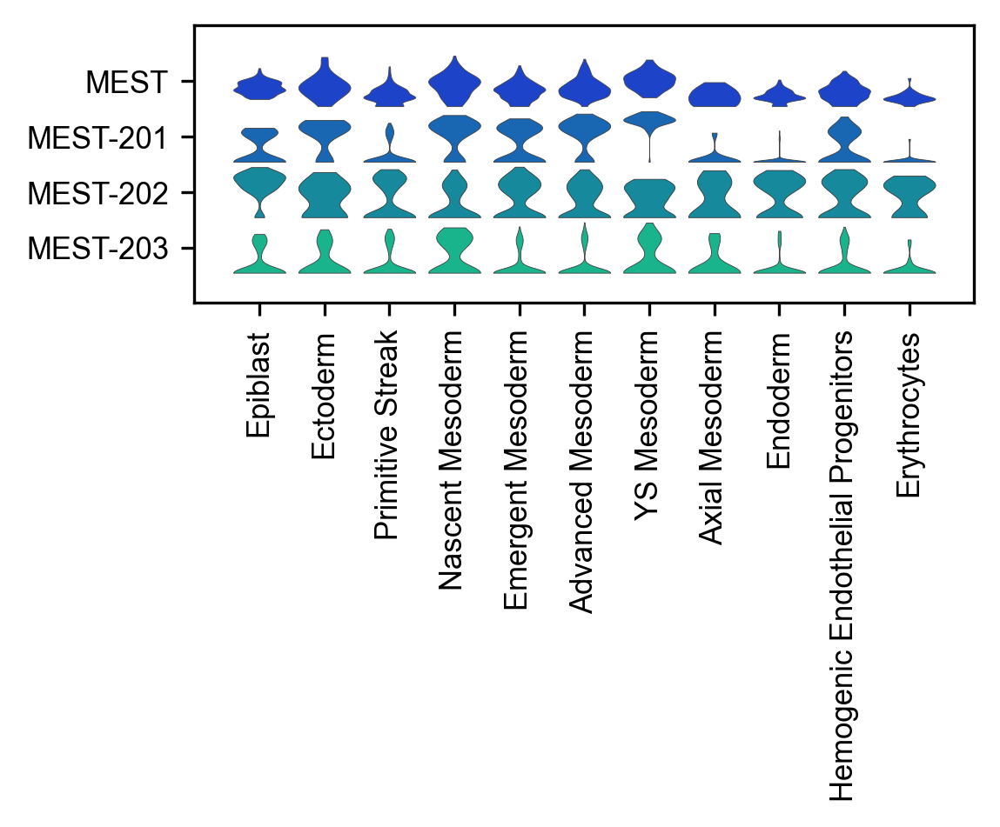

In [27]:
scv.settings.set_figure_params('scvelo',vector_friendly=False,format='pdf',dpi=150,dpi_save=150,fontsize=10)

sc.pl.stacked_violin(g1,g1.var_names,groupby='cluster_id',swap_axes=True,
row_palette='winter',standard_scale='var',categories_order=['Epiblast','Ectoderm','Primitive Streak','Nascent Mesoderm','Emergent Mesoderm','Advanced Mesoderm'
,'YS Mesoderm','Axial Mesoderm','Endoderm','Hemogenic Endothelial Progenitors','Erythrocytes']
,yticklabels=False,save='MEST_iso.pdf')


In [20]:
g1 = gene[:,'MEST'].to_df()
mest = find_trs('MEST')
ii = iso[:,mest]
#ii.var_names = find_trsn('MEST')
g1.reset_index(drop=True, inplace=True)

['MEST-201',
 'MEST-202',
 'MEST-203',
 'MEST-204',
 'MEST-205',
 'MEST-206',
 'MEST-207',
 'MEST-208',
 'MEST-210',
 'MEST-211',
 'MEST-212',
 'MEST-213',
 'MEST-214',
 'MEST-215',
 'MEST-216',
 'MEST-217']

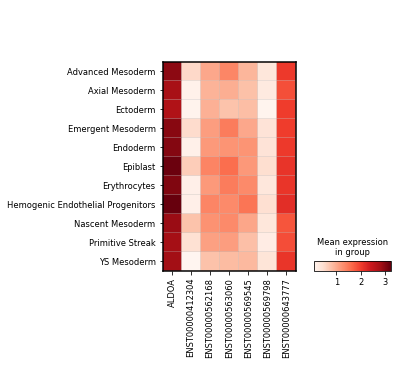

In [162]:
all_colors = ['#4E9C6D','#84584E','#58BDCC','#B6BD6E','#EF8635','#3C76AF',
'#C53933','#9D48F3','#D57DBF','#B3C6E5','#f4aeae']
endo_cols = ["#df72ef", "#480f2d", "#fbcab9", "#bd836e"]

In [21]:

sc.pl.stacked_violin(iso,'GNAS',groupby='clust_id',row_palette=['#4E9C6D','#84584E','#58BDCC','#B6BD6E','#EF8635','#3C76AF',
'#C53933','#9D48F3','#D57DBF','#B3C6E5','#f4aeae'],
                     figsize=(12,8),yticklabels=True)

,Gene stable ID,Transcript stable ID,Gene name,Transcript name
34738,ENSG00000106484,ENST00000223215,MEST,MEST-201
34731,ENSG00000106484,ENST00000341441,MEST,MEST-202
34734,ENSG00000106484,ENST00000378576,MEST,MEST-203
34736,ENSG00000106484,ENST00000393187,MEST,MEST-204
34735,ENSG00000106484,ENST00000399874,MEST,MEST-205
34732,ENSG00000106484,ENST00000416162,MEST,MEST-206
34737,ENSG00000106484,ENST00000421001,MEST,MEST-207
34733,ENSG00000106484,ENST00000427521,MEST,MEST-208
34740,ENSG00000106484,ENST00000437637,MEST,MEST-210
34739,ENSG00000106484,ENST00000437945,MEST,MEST-211
